In [1]:
from HeaderP import *

In [2]:
from astropy.io import fits
import pandas as pd
import astropy.coordinates as coord
from astropy.coordinates import SkyCoord
import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u
from astropy.table import QTable

filename = '../APOGEE_IPL3/astraAllStarASPCAP-0.5.0.fits'


# This function is my way to get ride of columns that are more than 1D, since I don't think pandas supports that 
def Table_to_pandas(fn):
    data = fits.open(fn)
    df = QTable(data[2].data)
    cols = []
    cols_drop = []
    for i in df.columns:
        #print(boss_mwm[i][0])
        if np.size(df[i][0])==1:
            cols.append(i)
        else:
            cols_drop.append(i)
    print(cols_drop)
    return df[cols].to_pandas()


# read in the allstar file and convert to dataframe
df = Table_to_pandas(filename)


['sdss5_target_flags']


In [3]:
# get rid of metallicity flag and check the min metallicity to make sure it makes sense
df = df.loc[df['fe_h_flags']==0].reset_index(drop=True)
min(df['fe_h'])

-2.505263328552246

In [4]:
# get rid of stars with < 0 distance
df = df.loc[df['plx']>0]

In [5]:
# use skycoord to input information
c = SkyCoord(ra=df.ra.values*u.deg, dec=df.dec.values*u.deg, 
             distance=(1/df.plx.values)*u.kpc,
             pm_ra_cosdec=df.pmra.values*u.mas/u.yr, 
             pm_dec=df.pmde.values*u.mas/u.yr,
            radial_velocity=df.gaia_v_rad.values*u.km/u.s)

In [6]:
# transform to galactocentric coordinate
galcen = c.transform_to(coord.Galactocentric(galcen_v_sun=[8, 254, 8] * u.km / u.s, galcen_distance=8.275 * u.kpc))


In [7]:
df['x'] = galcen.x.value
df['y'] = galcen.y.value
df['z'] = galcen.z.value

df['vx'] = galcen.v_x.value
df['vy'] = galcen.v_y.value
df['vz'] = galcen.v_z.value


In [8]:
ZTF = pd.read_csv('../NewGyroKineage/Tab2.csv')

In [9]:
ZTF = pd.merge(ZTF, df, left_on='source_id',
               right_on='gaia_dr3_source_id', how='inner')

In [10]:
ZTF_planet = pd.read_csv('../NewGyroKineage/Tab3.csv')
ZTF_planet = ZTF_planet.dropna(subset=['gaia_id'])

In [11]:
ZTF_planet['source_id'] = [int(i.split('Gaia DR2 ')[-1]) for i in ZTF_planet['gaia_id']]

In [12]:
ZTF_planet = pd.merge(ZTF_planet, df, left_on='source_id',
               right_on='gaia_dr2_source_id', how='inner')

959 96


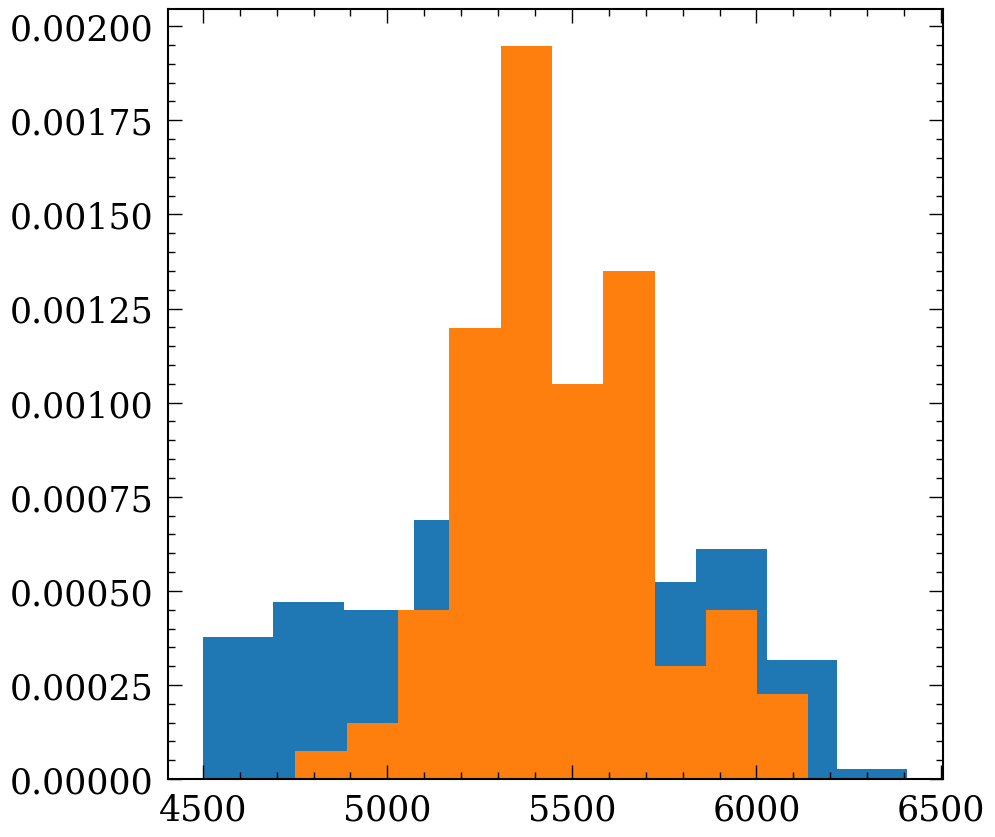

In [13]:
m = ((ZTF['Age']>1.5)&(ZTF['teff_y']>4500))
m2 = ((ZTF_planet['Age']>1.5)&(ZTF_planet['teff_y']>4500))
plt.hist(ZTF['teff_y'][m], density=True)
plt.hist(ZTF_planet['teff_y'][m2], density=True)
#m = (ZTF['teff_y']>3500)
#m2 = (ZTF_planet['teff_y']>3500)
print(sum(m), sum(m2))

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_29117/2293349259.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ZTF['mg_fe'] = ZTF['mg_h']-ZTF['fe_h']
/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_29117/2293349259.py:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  ZTF_planet['mg_fe'] = ZTF_planet['mg_h']-ZTF_planet['fe_h']


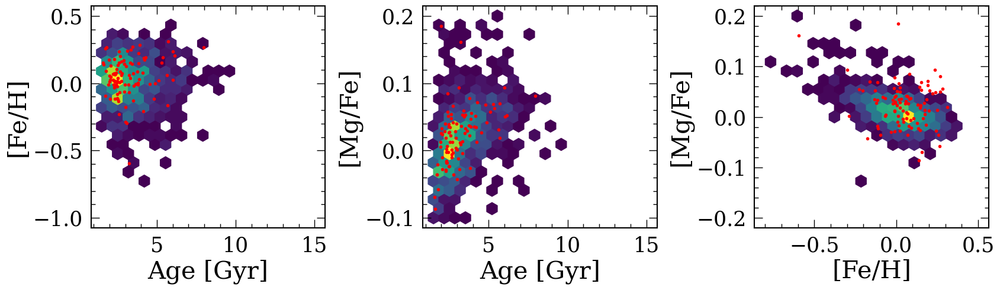

In [14]:
plt.figure(figsize=(17,5))
plt.subplot(1,3,1)
plt.hexbin(ZTF['Age'][m], ZTF['fe_h'][m],
          extent=(1.5, 15, -1, 0.5), mincnt=1,
          gridsize=20)
plt.plot(ZTF_planet['Age'][m2], ZTF_planet['fe_h'][m2], 'r.')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Fe/H]')

plt.subplot(1,3,2)
ZTF['mg_fe'] = ZTF['mg_h']-ZTF['fe_h']
ZTF_planet['mg_fe'] = ZTF_planet['mg_h']-ZTF_planet['fe_h']
df['mg_fe'] = df['mg_h'] - df['fe_h']

plt.hexbin(ZTF['Age'][m], ZTF['mg_fe'][m],
          extent=(1.5, 15, -0.1, 0.2), mincnt=1,
          gridsize=20)
plt.plot(ZTF_planet['Age'][m2], ZTF_planet['mg_fe'][m2], 'r.')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Mg/Fe]')

plt.subplot(1,3,3)
"""plt.hexbin(df['fe_h'][(df['logg']>4)&(df['teff']>4500)], 
           df['alpha_m_atm'][(df['logg']>4)&(df['teff']>4500)],
          extent=(-0.8, 0.5, -0.1, 0.2), mincnt=1,
          gridsize=50, cmap='binary')"""
#plt.colorbar()
plt.hexbin(ZTF['fe_h'][m], ZTF['alpha_m_atm'][m],
          extent=(-0.8, 0.5, -0.2, 0.2), mincnt=1,
          gridsize=20)
plt.plot(ZTF_planet['fe_h'][m2], ZTF_planet['mg_fe'][m2], 
           'r.')
plt.xlabel('[Fe/H]')
plt.ylabel('[Mg/Fe]')
plt.tight_layout()

"m = ((ZTF['teff_y']>3700)&(ZTF['teff_y']<3800))\nplt.scatter(ZTF['Prot'], ZTF['mg_h_cannon']-ZTF['fe_h_cannon'], \n            c=ZTF['teff_y'], vmin=3000, vmax=4000, )\nplt.xlabel('Prot')\nplt.ylabel('[Mg/Fe]')"

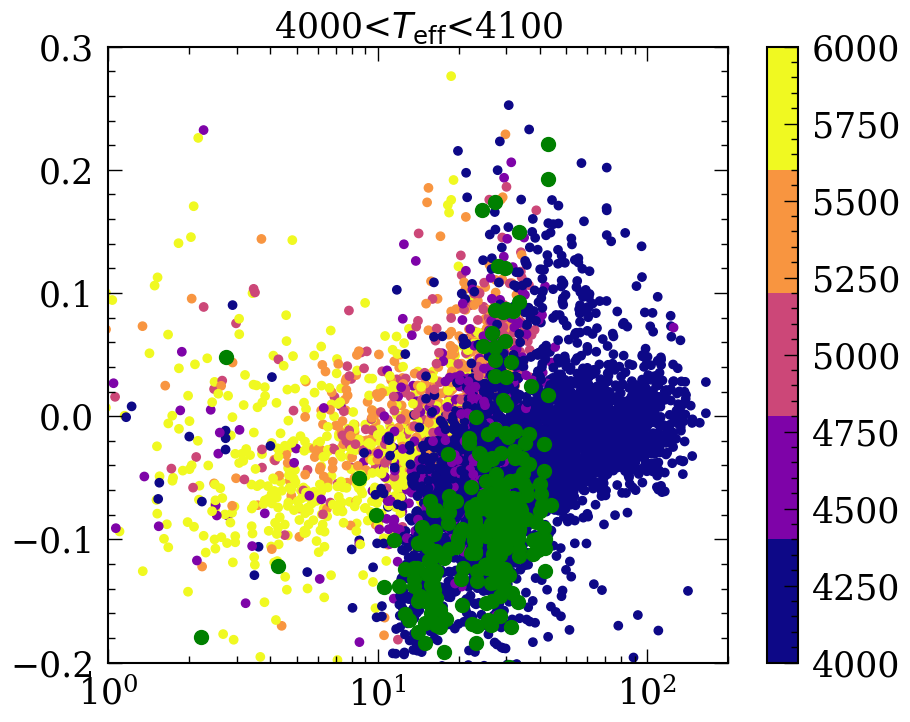

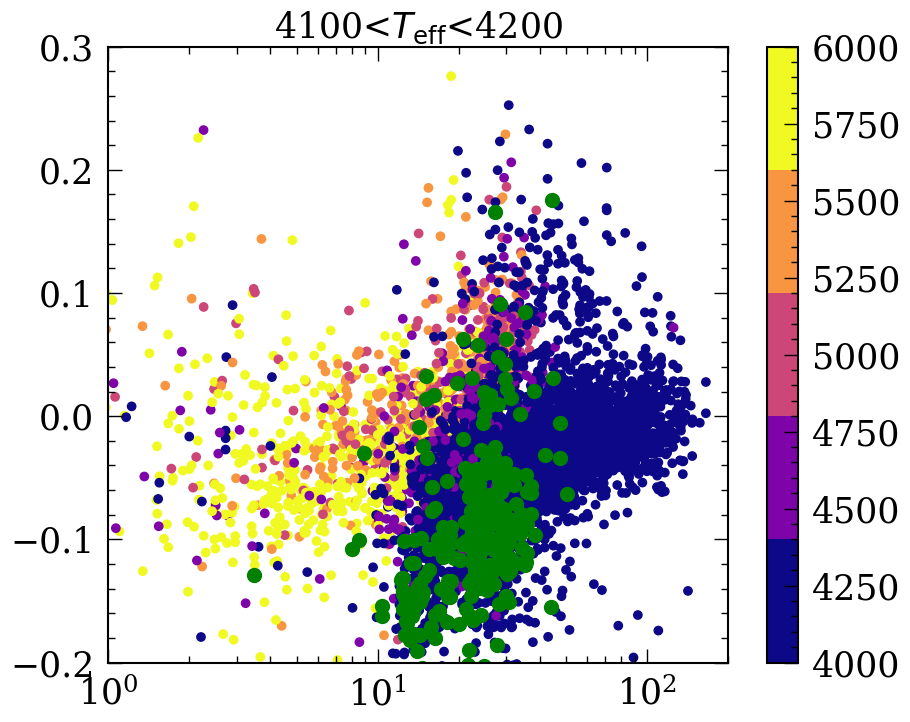

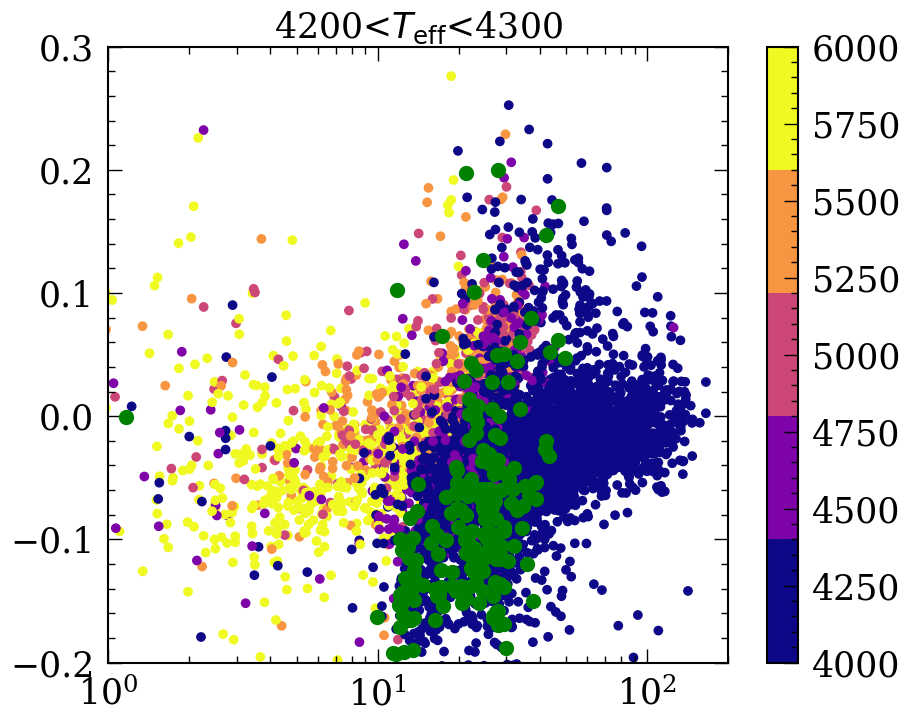

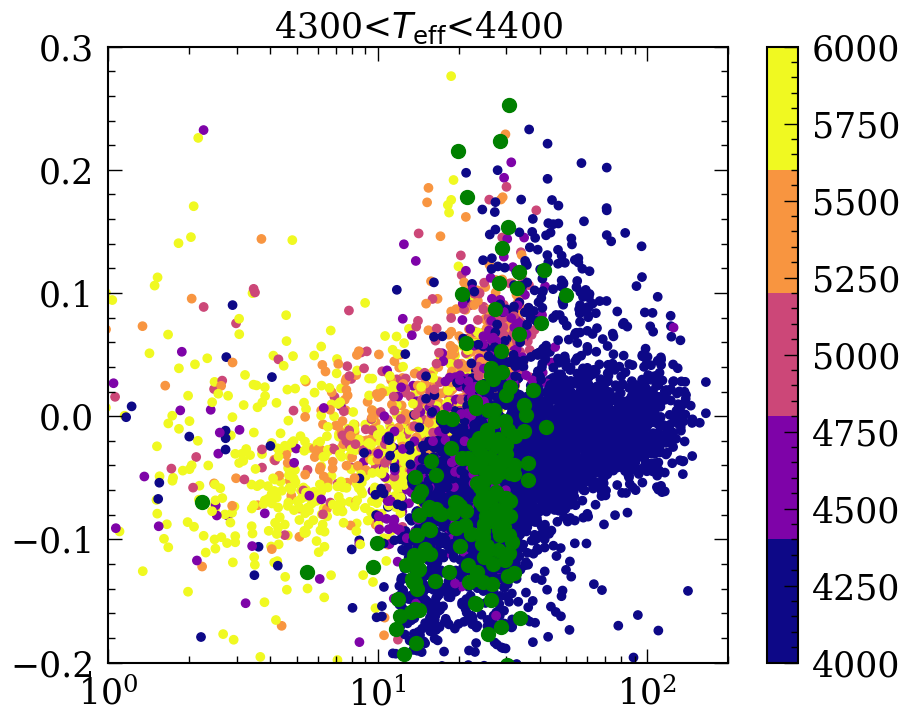

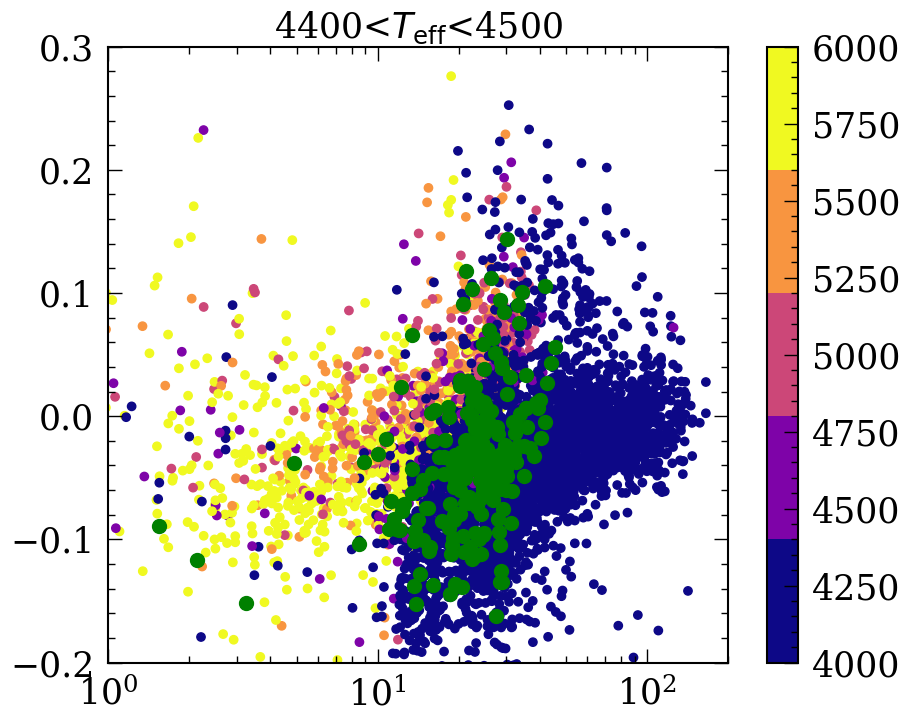

...

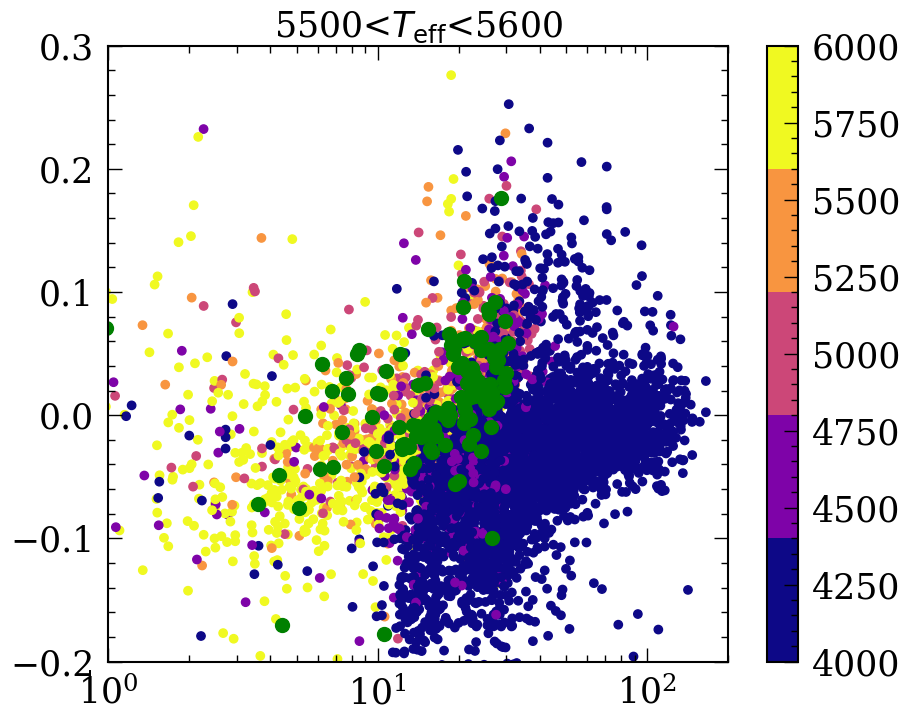

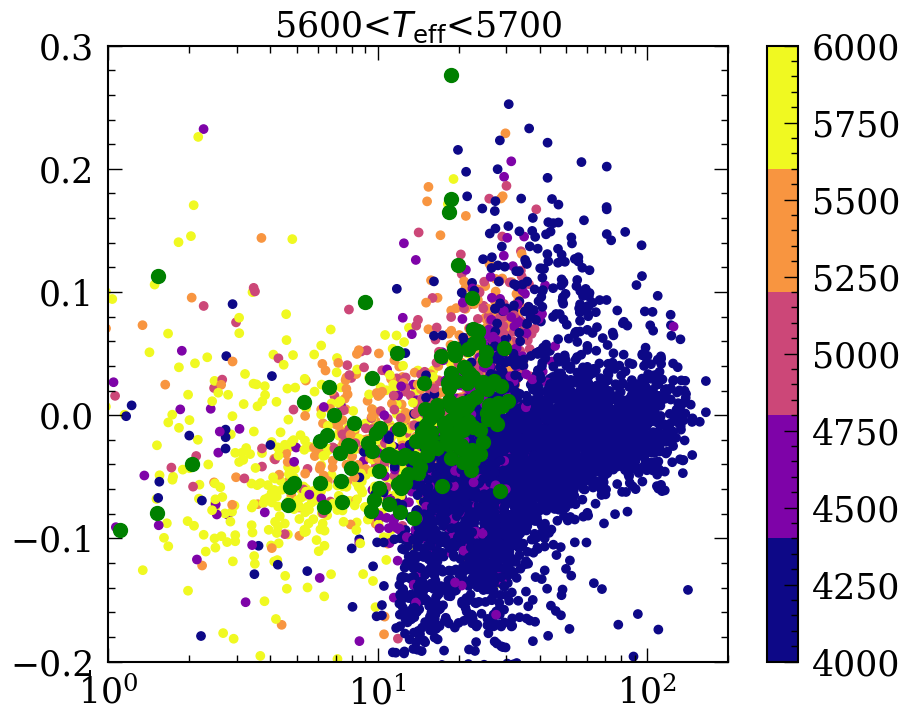

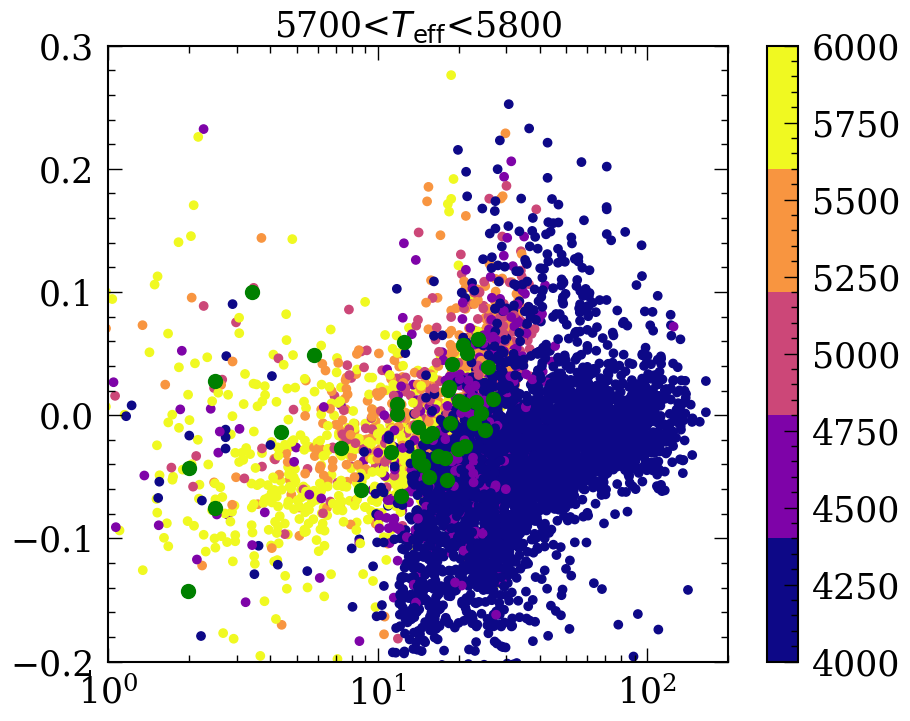

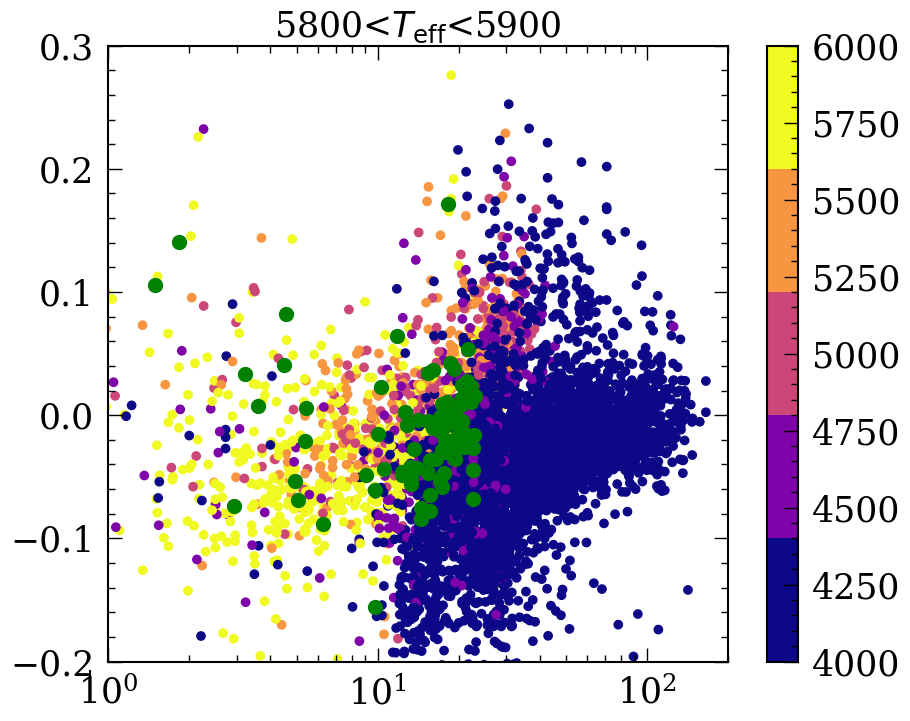

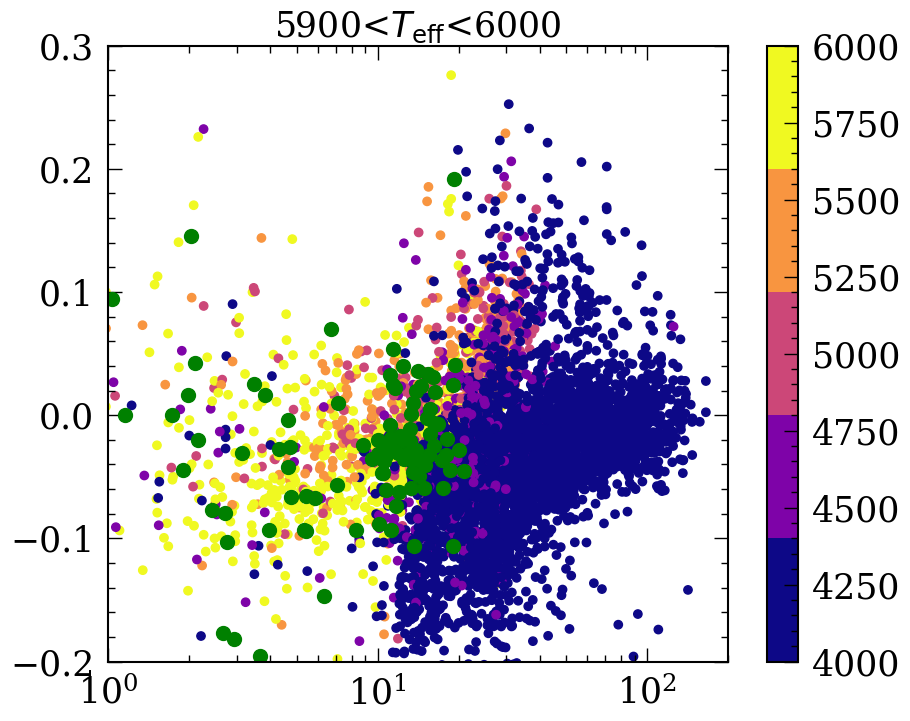

In [15]:
teffbin = np.linspace(4000, 6000, 21)
for i in range(len(teffbin)-1):
    plt.figure(figsize=(10,8))
    plt.scatter(ZTF['Prot'], ZTF['mg_h']-ZTF['fe_h'], 
                c=ZTF['teff_y'], vmin=4000, vmax=6000,
               cmap=plt.get_cmap('plasma', 5))
    m = ((ZTF['teff_y']>teffbin[i])&(ZTF['teff_y']<teffbin[i+1]))
    plt.plot(ZTF['Prot'][m], (ZTF['mg_h']-ZTF['fe_h'])[m], 
             'go', markersize=10)
    plt.title('%d<$T_{\\rm eff}$<%d'%(teffbin[i], teffbin[i+1]), fontsize=25)
    plt.colorbar()
    plt.ylim([-0.2, 0.3])
    plt.xlim([1,200])
    plt.xscale('log')

"""m = ((ZTF['teff_y']>3700)&(ZTF['teff_y']<3800))
plt.scatter(ZTF['Prot'], ZTF['mg_h_cannon']-ZTF['fe_h_cannon'], 
            c=ZTF['teff_y'], vmin=3000, vmax=4000, )
plt.xlabel('Prot')
plt.ylabel('[Mg/Fe]')"""

(-0.1, 0.2)

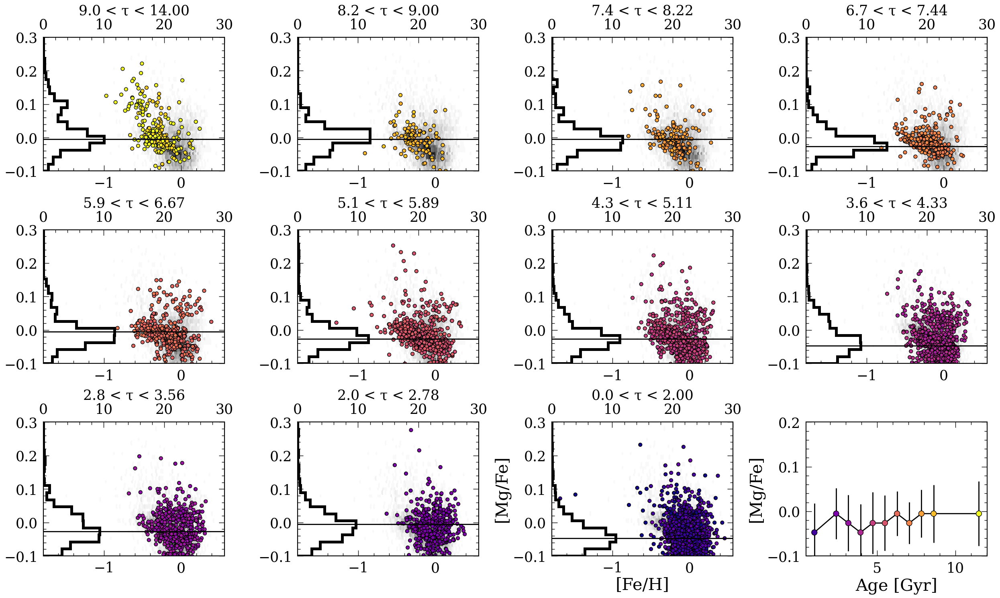

In [16]:
#agebins = [14, 9, 8, 7, 6, 5, 4, 3, 2, 0]
agebins = np.linspace(9,2,10)
agebins = np.append([14], agebins)
agebins = np.append(agebins, 0)
colors = getcolor(agebins)

maxfeh = np.zeros(len(agebins)-1)
stds = np.zeros(len(agebins)-1)
for i in range(len(agebins)-1):
    m = ((ZTF['Age']>agebins[i+1])&(ZTF['Age']<agebins[i]))
    x, y = np.histogram(ZTF['mg_h'][m]-ZTF['fe_h'][m],
                       bins=np.linspace(-0.1, 0.3, 20))
    y = y[1:]/2+y[:-1]/2
    maxfeh[i] = y[np.argmax(x)]
    stds[i] = np.std(ZTF['mg_h'][m]-ZTF['fe_h'][m])
    
plt.figure(figsize=(25,15))
for i in range(len(agebins)-1):
    plt.subplot(3,4,i+1)
    plt.hexbin(ZTF['fe_h'], ZTF['mg_h']-ZTF['fe_h'],
              cmap='binary')
    plt.title('%.1f < τ < %.2f'%(agebins[i+1], agebins[i]), fontsize=25)
    m = ((ZTF['Age']>agebins[i+1])&(ZTF['Age']<agebins[i]))
    plt.scatter(ZTF['fe_h'][m], ZTF['mg_h'][m]-ZTF['fe_h'][m], 
                c=ZTF['Age'][m], vmin=0, vmax=10, s=40, edgecolor='k', 
               cmap='plasma')
    plt.ylim([-0.1, 0.3])
    if i==len(agebins)-2:
        #plt.colorbar()
        plt.xlabel('[Fe/H]')
        plt.ylabel('[Mg/Fe]')
        
    plt.twiny()
    plt.hist(ZTF['mg_h'][m]-ZTF['fe_h'][m],
            histtype='step', linewidth=5, bins=np.linspace(-0.1, 0.3, 20),
            color='k', orientation='horizontal', density=True)
    plt.xlim([0, 30])
    
    plt.hlines(maxfeh[i], 0, 30, color='k')
    
        
    plt.tight_layout()
    
plt.subplot(3,4,len(agebins))
agebins = np.array(agebins)
plt.errorbar(agebins[1:]/2+agebins[:-1]/2, maxfeh, 
             yerr=stds,
        fmt='k-', zorder=1)
plt.scatter(agebins[1:]/2+agebins[:-1]/2, maxfeh, 
        c=agebins[1:]/2+agebins[:-1]/2,
           vmin=0, vmax=10, s=100, edgecolor='k', zorder=2,
           cmap='plasma')
plt.xlabel('Age [Gyr]')
plt.ylabel('[Mg/Fe]')
plt.ylim([-0.1, 0.2])


In [17]:
ZTF.to_csv('GPGyro_MWM_ZTF_Kepler.csv', index=False)

In [18]:
planet = pd.read_csv('PS_2024.08.08_08.34.15.csv', skiprows=107)
planet = pd.merge(planet, ZTF_planet, left_on='hostname', right_on='hostname',
                 how='left')

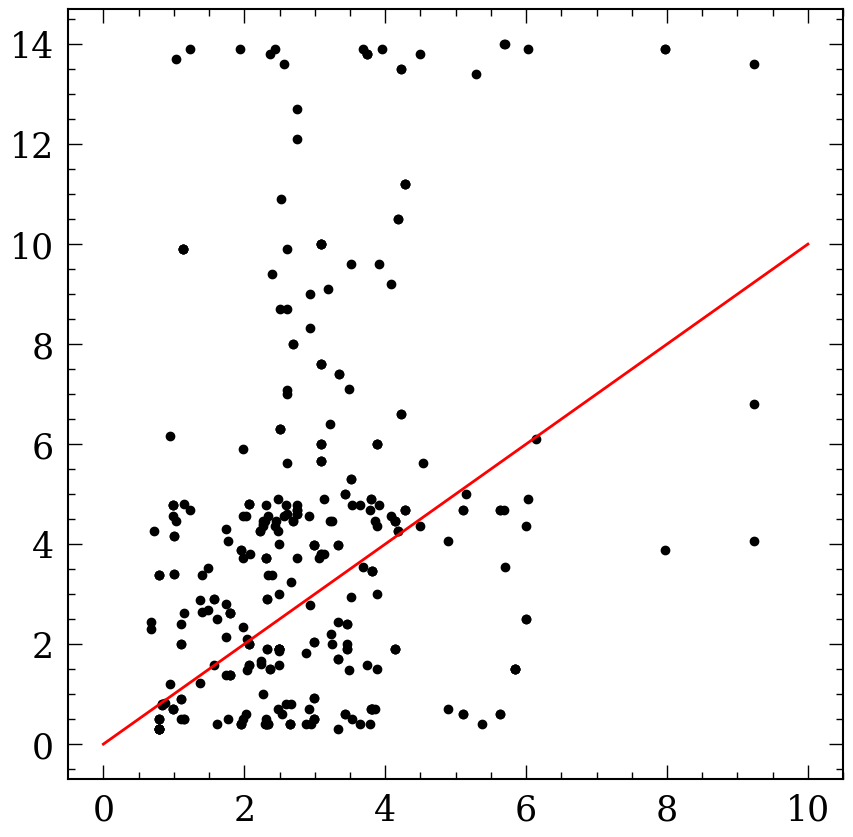

In [19]:
planet = planet.dropna(subset='Age')
plt.plot(planet['Age'], planet['st_age'], 'ko')
plt.plot([0, 10], [0, 10], 'r-')

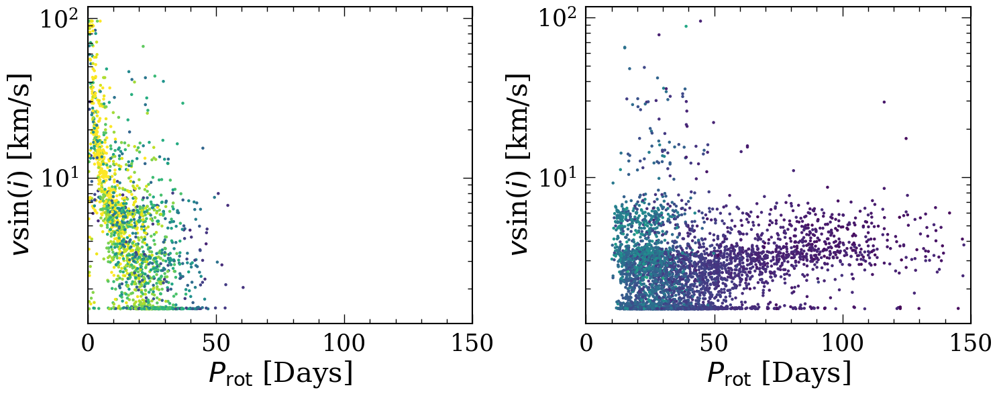

In [20]:
plt.figure(figsize=(15,6))


plt.subplot(1,2,1)
keplerstars = (ZTF['KID']>0)
plt.scatter(ZTF['Prot'][keplerstars], 
            ZTF['v_sini'][keplerstars], 
            c=ZTF['teff_y'][keplerstars], 
           vmin=3000, vmax=6000, s=5)
plt.yscale('log')
plt.xlabel('$P_{\\rm rot}$ [Days]')
plt.ylabel('$v$sin($i$) [km/s]')
plt.xlim([0,150])

plt.subplot(1,2,2)
keplerstars = (ZTF['KID']==0)
plt.scatter(ZTF['Prot'][keplerstars], 
            ZTF['v_sini'][keplerstars], 
            c=ZTF['teff_y'][keplerstars], 
           vmin=3000, vmax=6000, s=5)
plt.yscale('log')
plt.xlabel('$P_{\\rm rot}$ [Days]')
plt.ylabel('$v$sin($i$) [km/s]')
plt.xlim([0,150])
plt.tight_layout()




In [21]:
elements = [i for i in ZTF.columns if '_h' in i and 'raw' not in i and 'flags' not in i and 'chi2' not in i and 'pk' not in i and 'e_' not in i][3:]
len(elements)

21

In [22]:
planet['SE'] = ((planet['pl_rade']<4)&(planet['pl_orbper']<100))
planet['HWJ'] = ((planet['pl_rade']>4)&(planet['pl_orbper']<100))
planet['type'] = planet['SE']*2+planet['HWJ']

115 980


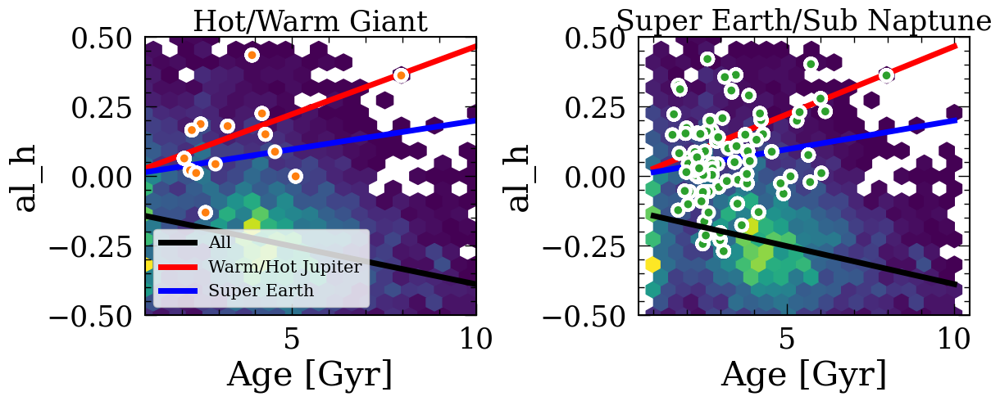

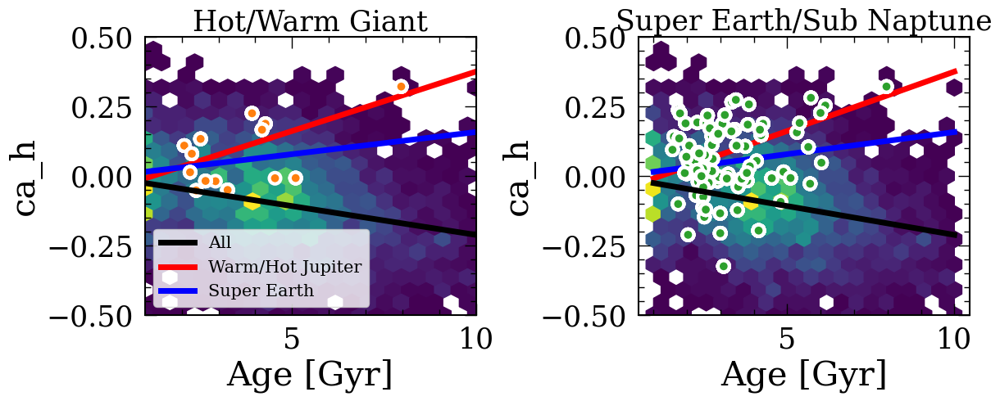

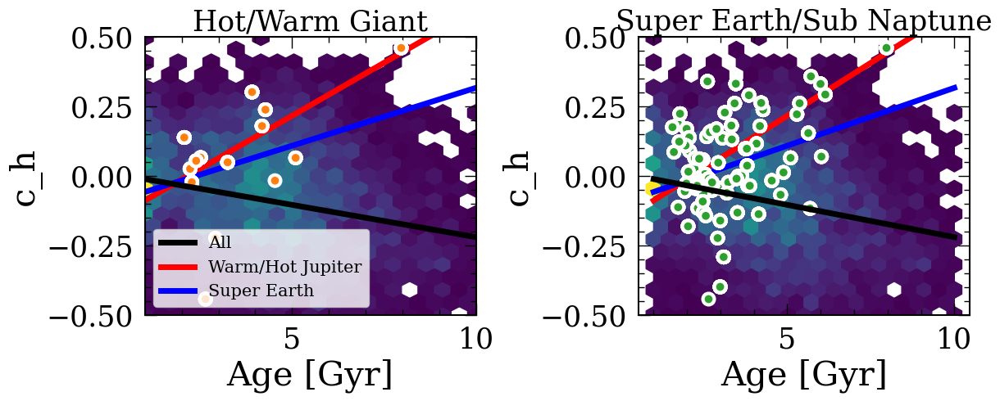

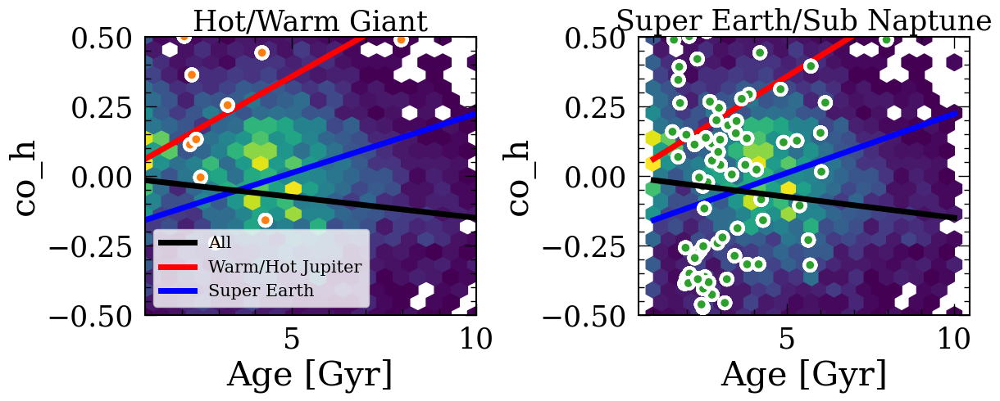

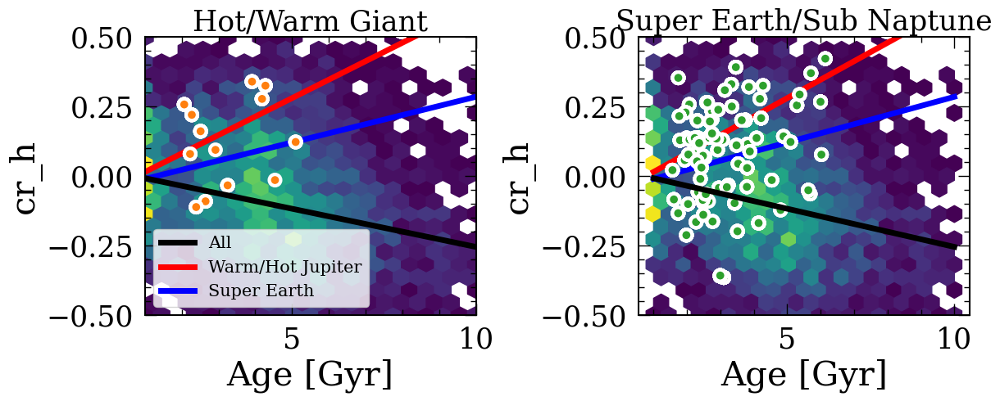

...

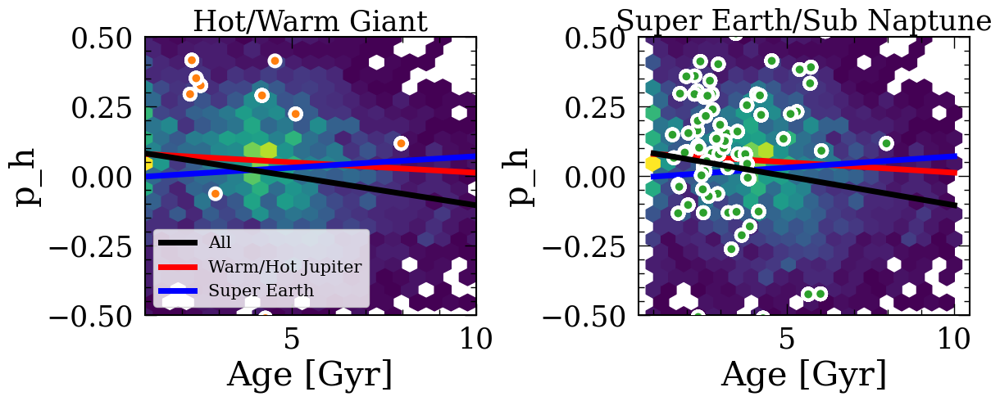

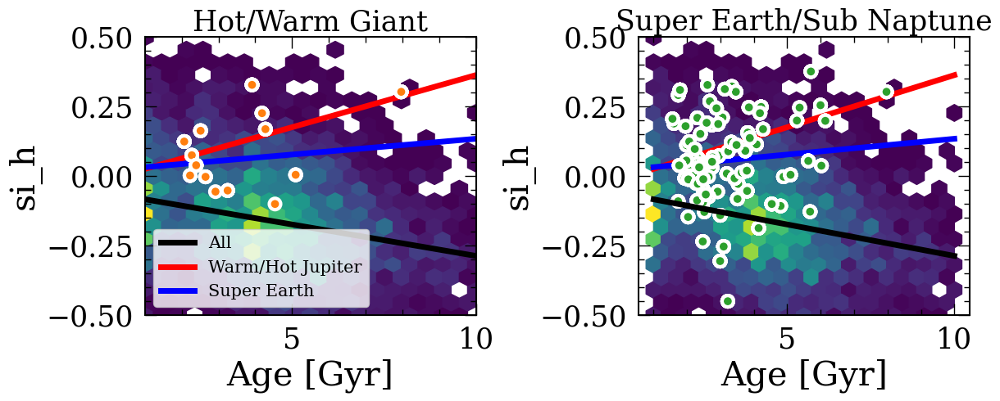

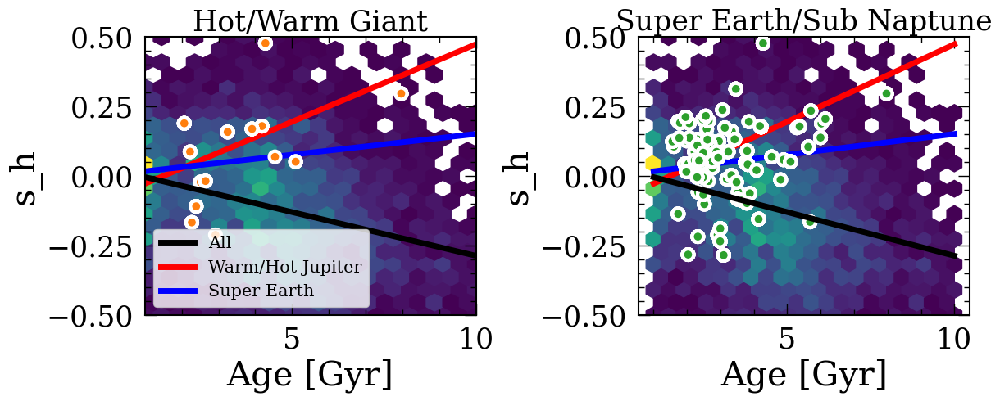

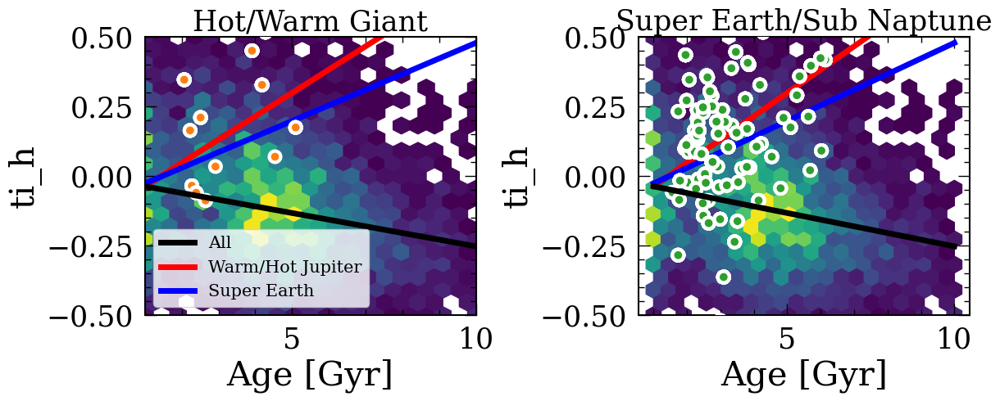

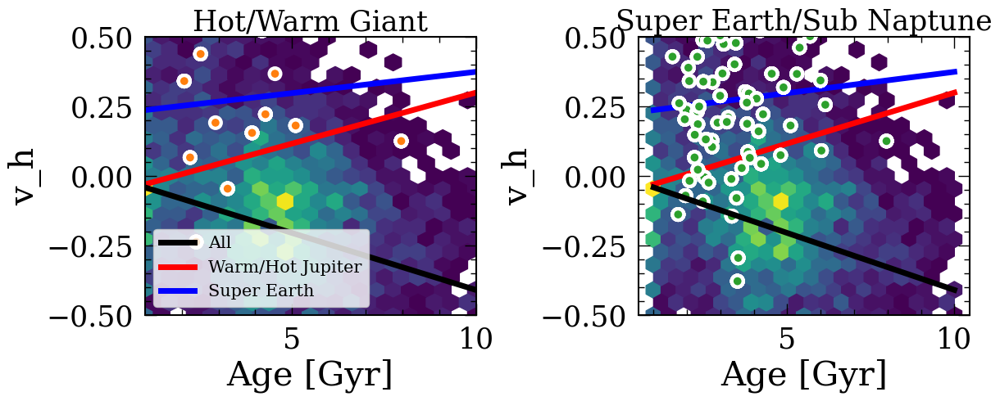

In [24]:
m3 = ((planet['teff_y']>4500)&(planet['Age']>1.5))
m4 = ((planet['type']==1)|(planet['type']==3))
m5 = ((planet['type']==2)|(planet['type']==3))
print(sum(m4), sum(m5))

for i in range(len(elements)):
    ele = ZTF[elements[i]]
    if len(ele.dropna())==0:
        continue
   
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.hexbin(ZTF['Age'], ZTF[elements[i]],
              extent=(1, 10, -0.5, 0.5), mincnt=1,
              gridsize=20, zorder=1)
    
    p_all = fitpoints(ZTF['Age'][ZTF[elements[i]]==ZTF[elements[i]]], 
                      ZTF[elements[i]][ZTF[elements[i]]==ZTF[elements[i]]], 1)
    plt.plot(np.linspace(1,10, 100), p_all(np.linspace(1,10, 100)), color='k',
            linewidth=5, zorder=4, label='All')
    
    plt.scatter(planet['Age'][m3&m4], planet[elements[i]][m3&m4], 
                c=planet['type'][m3&m4], zorder=3, edgecolor='w', linewidth=3,
               s=100, cmap='tab10', vmin=0, vmax=10)
    
    p_wj = fitpoints(planet['Age'][m3&m4], planet[elements[i]][m3&m4], 1)
    plt.plot(np.linspace(1,10, 100), p_wj(np.linspace(1,10, 100)), color='r',
            linewidth=5, label='Warm/Hot Jupiter')
    p_ep = fitpoints(planet['Age'][m3&m5], planet[elements[i]][m3&m5], 1)
    plt.plot(np.linspace(1,10, 100), p_ep(np.linspace(1,10, 100)), color='b',
            linewidth=5, label='Super Earth')
    
    plt.legend(frameon=True, fontsize=15, loc=3)
    
    
    
    plt.xlabel('Age [Gyr]')
    plt.ylabel(elements[i])
    plt.xlim([1,10])
    plt.ylim([-0.5, 0.5])
    plt.title('Hot/Warm Giant', fontsize=25)
    
    plt.subplot(1,2,2)
    ele = ZTF[elements[i]]
    if len(ele.dropna())==0:
        continue
   
    plt.hexbin(ZTF['Age'], ZTF[elements[i]],
              extent=(1, 10, -0.5, 0.5), mincnt=1,
              gridsize=20, zorder=1)
    plt.scatter(planet['Age'][m3&m5], planet[elements[i]][m3&m5], 
                c=planet['type'][m3&m5], zorder=3, edgecolor='w', linewidth=3,
               s=100, cmap='tab10', vmin=0, vmax=10)
    
    plt.plot(np.linspace(1,10, 100), p_all(np.linspace(1,10, 100)), color='k',
            linewidth=5, zorder=4)
    plt.plot(np.linspace(1,10, 100), p_wj(np.linspace(1,10, 100)), color='r',
            linewidth=5)
    plt.plot(np.linspace(1,10, 100), p_ep(np.linspace(1,10, 100)), color='b',
            linewidth=5)
    
    plt.xlabel('Age [Gyr]')
    plt.ylabel(elements[i])
    #plt.xlim([1,10])
    plt.title('Super Earth/Sub Naptune', fontsize=25)
    plt.ylim([-0.5, 0.5])
    plt.tight_layout()

Text(0, 0.5, 'Orbital Period [Days]')

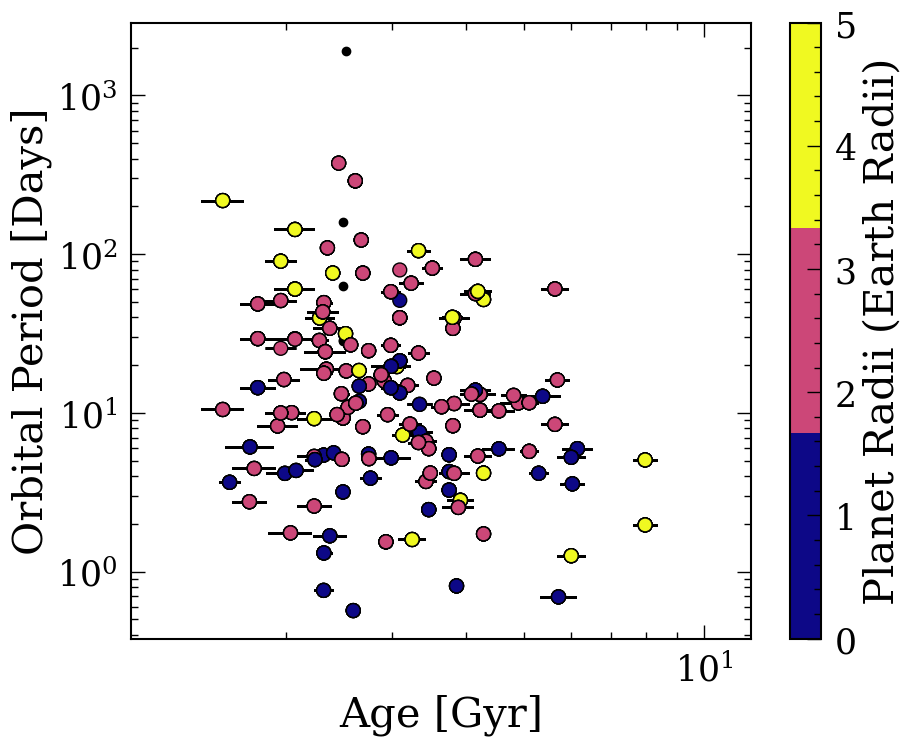

In [73]:
plt.figure(figsize=(10,8))
m3 = ((planet['teff_y']>4500)&(planet['Age']>1.5))
plt.errorbar(planet['Age'][m3], planet['pl_orbper'][m3], 
             xerr=planet['Age_err_p'][m3], 
             yerr=planet['pl_orbeccenerr1'][m3],
            fmt='ko', zorder=1)
plt.scatter(planet['Age'][m3], planet['pl_orbper'][m3], 
             c=planet['pl_rade'][m3], s=100, zorder=2,
           edgecolor='k', vmin=0, vmax=5, cmap=plt.get_cmap('plasma', 3))
plt.colorbar(label='Planet Radii (Earth Radii)')
plt.xlim([1.1, 12])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Age [Gyr]')
plt.ylabel('Orbital Period [Days]')

Text(0, 0.5, 'Planet Radii [Earth Radii]')

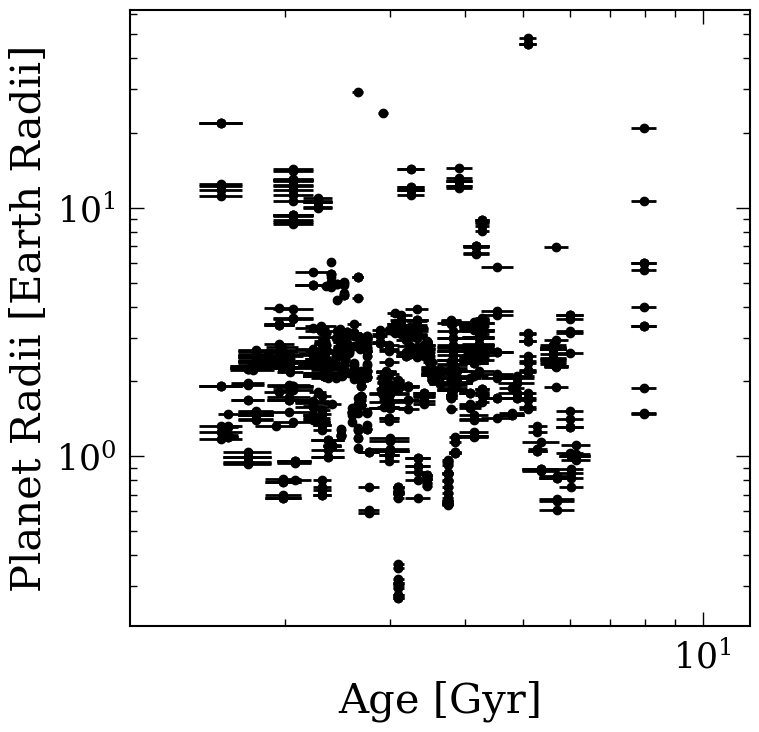

In [69]:
plt.figure(figsize=(8,8))
m3 = ((planet['teff_y']>4500)&(planet['Age']>1.5))
plt.errorbar(planet['Age'][m3], planet['pl_rade'][m3], 
             xerr=planet['Age_err_p'][m3],
            fmt='ko', zorder=1)
plt.xlim([1.1, 12])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Age [Gyr]')
plt.ylabel('Planet Radii [Earth Radii]')

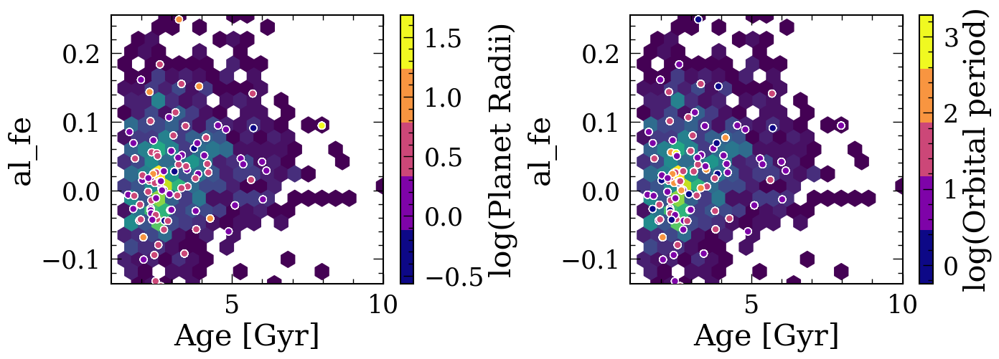

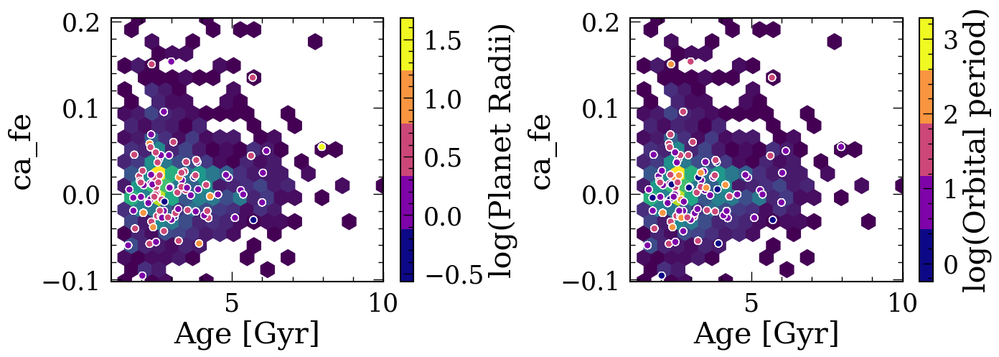

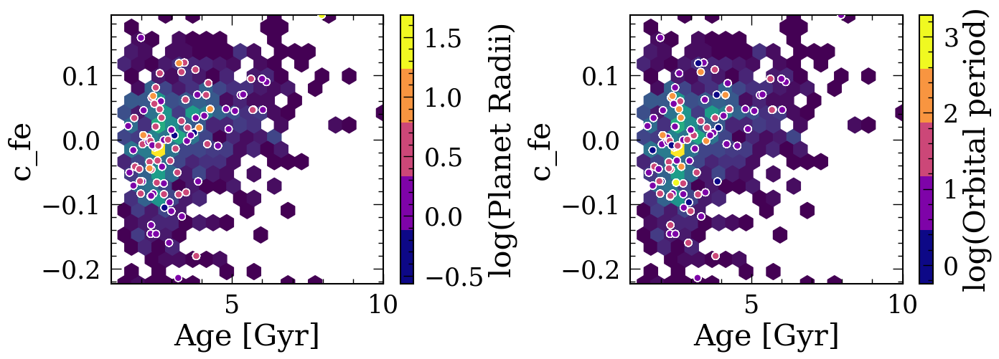

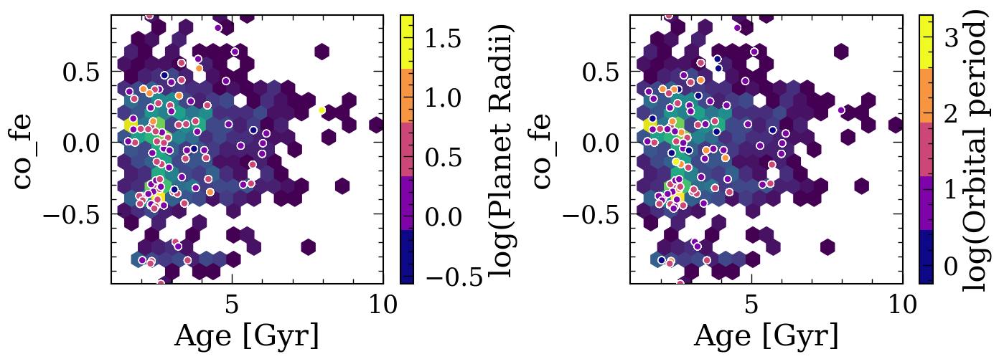

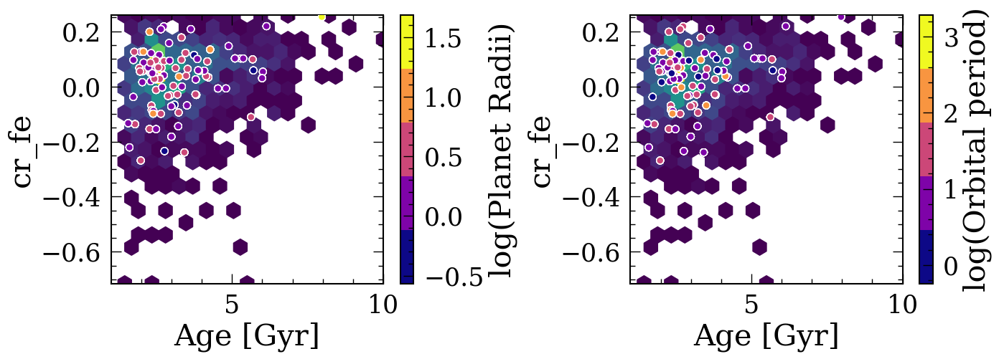

...

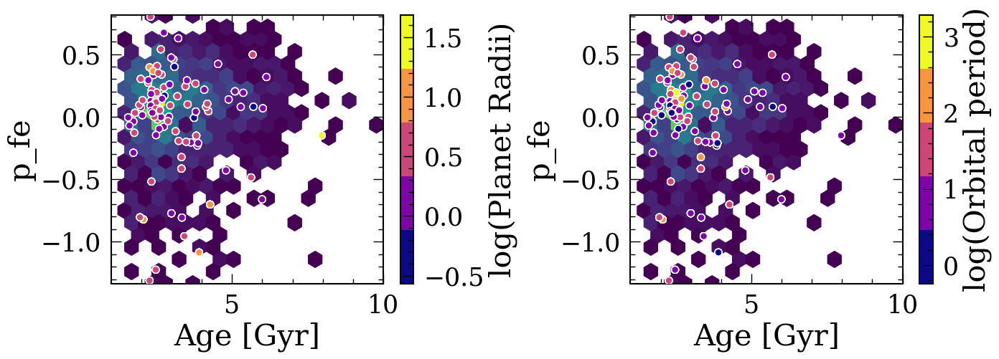

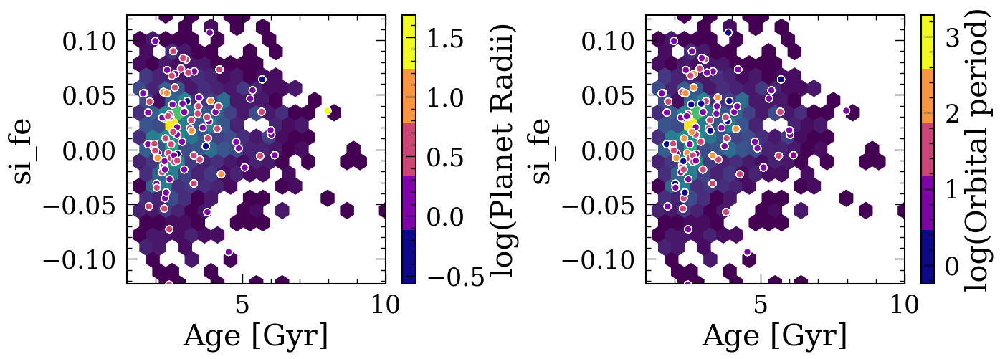

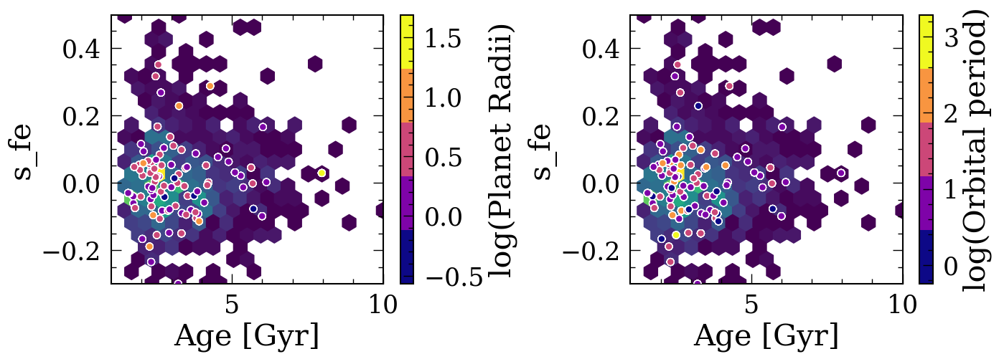

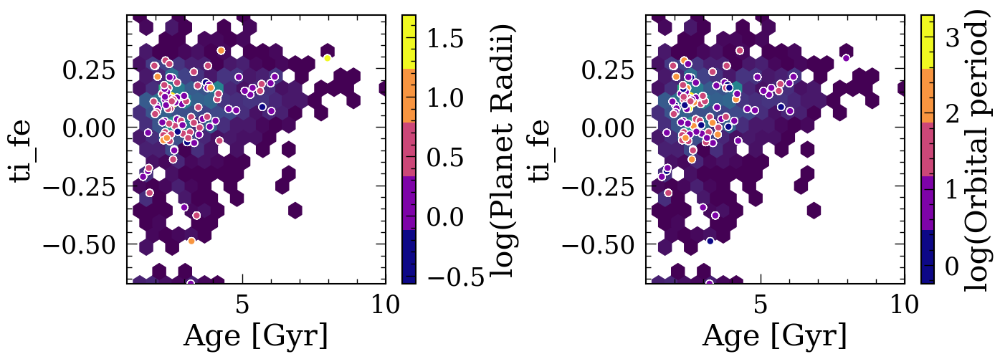

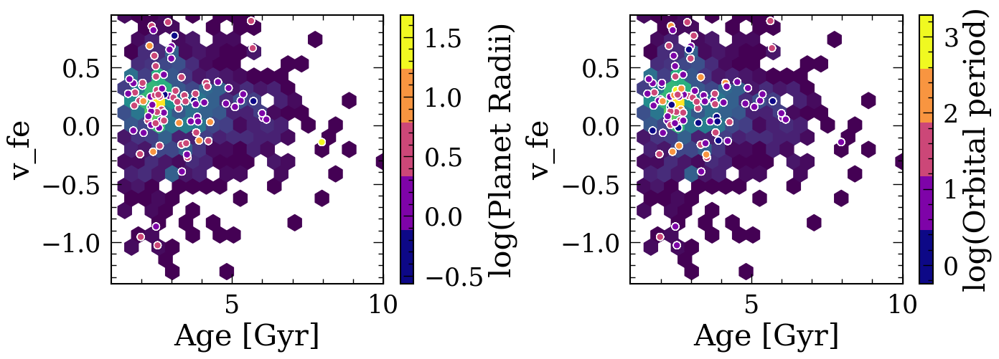

In [115]:
m3 = ((planet['teff_y']>4500)&(planet['Age']>1.5))
m4 = ((planet['type']==1)|(planet['type']==3))
m5 = ((planet['type']==2)|(planet['type']==3))

for i in range(len(elements)):
    ele = ZTF[elements[i]][m]-ZTF['fe_h'][m]
    if len(ele.dropna())==0:
        continue
   
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)
    plt.hexbin(ZTF['Age'][m], ZTF[elements[i]][m]-ZTF['fe_h'][m],
              extent=(1, 10, np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 1),
                     np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 99)), mincnt=1,
              gridsize=20, zorder=1)
    plt.scatter(planet['Age'][m3], planet[elements[i]][m3]-planet['fe_h'][m3], 
                c=np.log10(planet['pl_rade'][m3]), zorder=3, edgecolor='w', linewidth=1,
               s=50, cmap=plt.get_cmap('plasma', 5))
    plt.colorbar(label='log(Planet Radii)')
    plt.xlabel('Age [Gyr]')
    plt.ylabel(elements[i].split('_h')[0]+'_fe')
    plt.xlim([1,10])
    plt.ylim([np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 1), np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 99)])

    
    
    plt.subplot(1,2,2)
    plt.hexbin(ZTF['Age'][m], ZTF[elements[i]][m]-ZTF['fe_h'][m],
              extent=(1, 10, np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 1),
                     np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 99)), mincnt=1,
              gridsize=20, zorder=1)
    plt.scatter(planet['Age'][m3], planet[elements[i]][m3]-planet['fe_h'][m3], 
                c=np.log10(planet['pl_orbper'][m3]), zorder=3, edgecolor='w', linewidth=1,
               s=50, cmap=plt.get_cmap('plasma', 5))
    plt.colorbar(label='log(Orbital period)')
    plt.xlabel('Age [Gyr]')
    plt.ylabel(elements[i].split('_h')[0]+'_fe')
    plt.xlim([1,10])
    plt.ylim([np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 1), np.percentile((ZTF[elements[i]][m]-ZTF['fe_h'][m]).dropna(), 99)])
    plt.tight_layout()
    
   